# Исследование рынка общественного питания Москвы

## Описание проекта
**Цель исследования:** подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Инструменты:** столбчатые и круговые диаграммы, диаграммы размаха, геоаналитика (хороплет, кластеры, тепловая карта)

**Библиотеки:** matplotlib, seaborn, plotly, numpy, folium

**Краткий план:**
1. Загрузка данных и изучение общей информации
2. Предобработка данных
- дубликаты
- пропуски
- создание столбца с названиями улиц
- создание столбца с обозначением, что заведение работает ежедневно и круглосуточно
3. Анализ данных
- категории заведений
- количество посадочных мест
- соотношение сетевых и несетевых заведений
- Какие категории заведений чаще являются сетевыми?
- топ-15 популярных сетей
- количество заведений в административных районах
- распределение средних рейтингов по категориям
- фоновая картограмма со средним рейтингом заведений каждого района
- все заведения на карте с помощью кластеров
- топ-15 улиц по количеству заведений
- улицы, на которых находится только один объект общепита
- медиана средних чеков заведений и последующий анализ
4. Детализация исследования: открытие кофейни
- количество кофеен, районы-лидеры по количеству кофеен, особенности расположения
- круглосуточные кофейни
- рейтинги кофеен по районам
- стоимость чашки капучино
- рекомендацию для открытия нового заведения
5. Подготовка презентации
6. Выводы

# Описание данных
Файл *moscow_places.csv*:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

# 1. Открытие данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px

import seaborn as sns
import numpy as np
from numpy import median

#!pip install folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.plugins.heat_map import HeatMap

In [2]:
places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
places.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**Представлено 8406 заведений. В типах данных все в порядке, можно ничего не менять. Наблюдаются пропуски. Сравнивая средние и медианные значения, можно заметить разброс в количестве посадочных мест и в среднем чеке.**

# 2. Предобработка данных

In [5]:
# проверка на наличие явных дубликатов
print('Количество явных дубликатов:', places.duplicated().sum())

Количество явных дубликатов: 0


In [6]:
# проверка на наличие неявных дубликатов
places['name'].nunique()

5614

In [7]:
places['name'] = places['name'].str.lower()
places['name'].nunique()

5512

**Сократили с 5614 до 5512 уникальных заведений. В дальнейшем поможет более корректно группировать по названию заведения.**

In [8]:
places[['address', 'name']].value_counts()

address                                  name                     
Москва, Волоколамское шоссе, 11, стр. 2  more poke                    2
Москва, проспект Мира, 118               раковарня клешни и хвосты    2
Москва, Ярцевская улица, 19              хлеб да выпечка              2
Москва, 1-й Автозаводский проезд, 5      чайхана азия                 1
Москва, Широкая улица, 27                шаурма и бургер              1
                                                                     ..
Москва, Лесная улица, 20, стр. 3         gt. coffee                   1
                                         crema                        1
                                         bổ                           1
Москва, Лесная улица, 20, стр. 2         demokrat                     1
Москва, № 7                              енот                         1
Length: 8403, dtype: int64

In [9]:
places[places['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


In [10]:
# удалим первый дубликат
places = places.drop(index = 1430)

In [11]:
places[places['name'] == 'раковарня клешни и хвосты']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0


In [12]:
# удалим второй дубликат
places = places.drop(index = 2211)

In [13]:
places[places['name'] == 'хлеб да выпечка']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


In [14]:
# удалим третий дубликат
places = places.drop(index = 3109)
places = places.reset_index(drop=True)

In [15]:
# проверка: посчитаем дубликаты в столбцах name и address
places[['address', 'name']].value_counts()

address                                 name            
Москва, 1-й Автозаводский проезд, 5     чайхана азия        1
Москва, Шмитовский проезд, 39, корп. 1  milk&beans          1
Москва, Шмитовский проезд, 16с2         чашки               1
Москва, Шмитовский проезд, 12           может, кофе?        1
Москва, Шмитовский проезд, 10/7         неслучайно 08 08    1
                                                           ..
Москва, Лесная улица, 20, стр. 3        crema               1
                                        bổ                  1
Москва, Лесная улица, 20, стр. 2        demokrat            1
Москва, Лесная улица, 10-16             pinky               1
Москва, № 7                             енот                1
Length: 8403, dtype: int64

**Были неявные дубликаты в названиях заведений. Удалили 3 дубликата.**

In [16]:
# проверка на наличие пропусков
print('Количество пропусков:') 
print(places.isna().sum())

Количество пропусков:
name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64


**Есть пропуски в столбцах *hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats* - оставляем без изменений, поскольку заполнение пропусков сильно повлияет на результаты исследования (мало информации, чтобы можно было правильно заполнить пропуски).**

In [17]:
# добавление столбца с названиями улиц
places['street'] = places['address'].str.split(',', expand=True)[1]

# добавление столбца с обозначением, что заведениие работает 24/7
places['is_24/7'] = places['hours'].apply(lambda x: x =='ежедневно, круглосуточно')

places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Вывод:** Явные дубликаты не были обнаружены. Обнаружились неявные дубликаты в названиях заведений. Пропуски существуют, но их ничем не заполнить, иначе можем повредить анализ данных. Были добавлены столбцы 'street', 'is_24/7'.

# 3. Анализ данных

## 3.1 Категории заведений

In [18]:
# количество элементов в уникальных категориях
categories = pd.DataFrame(places['category'].value_counts(), columns=['category'])

categories

,category
кафе,2377
ресторан,2041
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


In [19]:
# считаем доли
categories['part'] = round(categories['category'] / categories['category'].sum(), 2)
categories = categories.reset_index()
categories.columns = ['category', 'count', 'part']
categories

,category,count,part
0,кафе,2377,0.28
1,ресторан,2041,0.24
2,кофейня,1413,0.17
3,"бар,паб",765,0.09
4,пиццерия,633,0.08
5,быстрое питание,603,0.07
6,столовая,315,0.04
7,булочная,256,0.03


In [20]:
#fig = go.Figure(data=[go.Pie(labels=categories['category'], 
#                             values=categories['part'],
#                            title='Соотношение категорий общественного питания по количеству')])
#fig.show()

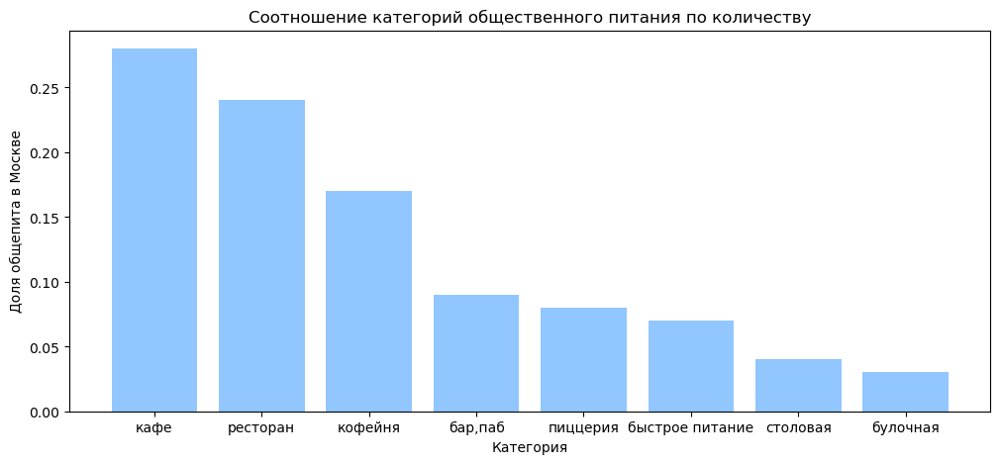

In [21]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=categories['category'], height=categories['part'])
    plt.title('Соотношение категорий общественного питания по количеству')
    plt.ylabel('Доля общепита в Москве')
    plt.xlabel('Категория')
plt.show()

**В Москве наиболее распространены категории общественного питания (около 3/4): кафе, рестораны, кофейни. Менее: столовые и булочные, по 3-4%.**

## 3.2 Посадочные места

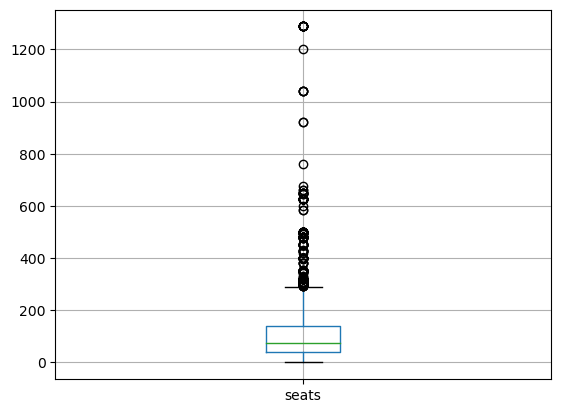

In [22]:
# построим разброс значений на графике "ящик с усами"
places.boxplot(column='seats')
plt.show()

**Большая часть значений расположена в диапазоне 40-140 мест. В столбце с посадочными местами существуют выбросы. Возьмем медианное значение, чтобы исследовать количество посадочных мест в местах по категориям**

In [23]:
categories_seats = places.groupby('category')['seats'].median().round(1).sort_values(ascending=False).reset_index()
categories_seats = categories_seats.rename(columns={'seats': 'seats_median'})
categories_seats

,category,seats_median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [24]:
fig = px.bar(categories_seats, 
             x='category', 
             y='seats_median'
            )
fig.update_layout(
    xaxis_title='Категории заведений',
    yaxis_title='Количество посадочных мест',
    title = 'Среднее количество посадочных мест по категориям'
)
fig.update_xaxes(tickangle=45)
fig.show()

**Больше посадочных мест в ресторанах, барах/пабах и в кофейнях. В пиццериях и булочных меньше осадочных мест.**

## 3.3 Соотношение сетевых и несетевых заведений по количеству

In [25]:
# заменим значения в столбце 'chain'
places.loc[places['chain'] == 1, 'chain'] = 'сеть'
places.loc[places['chain'] == 0, 'chain'] = 'не сеть'
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,не сеть,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,не сеть,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,не сеть,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,не сеть,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сеть,148.0,Правобережная улица,False


In [26]:
categories_chain = places.groupby(['category', 'chain']).agg({'name':'count'}).reset_index()
categories_chain = categories_chain.rename(columns={'name': 'count'}).sort_values(by='count', ascending=False)
categories_chain

,category,chain,count
6,кафе,не сеть,1598
12,ресторан,не сеть,1311
7,кафе,сеть,779
13,ресторан,сеть,730
9,кофейня,сеть,720
8,кофейня,не сеть,693
0,"бар,паб",не сеть,596
4,быстрое питание,не сеть,371
11,пиццерия,сеть,330
10,пиццерия,не сеть,303


In [27]:
fig = go.Figure(data=[go.Pie(labels=places['chain'].value_counts().index, 
                             values = places['chain'].value_counts(),
                            title='Соотношение сетевых и несетевых заведений по количеству')])
fig.show()

In [28]:
fig=px.bar(
    categories_chain, 
    x='category', 
    y='count', 
    color='chain', 
    barmode='group' 
#     text_auto = True
)
fig.update_layout(
    xaxis_title='Категории заведений',
    yaxis_title='Количество заведений',
    title='Количество сетевых и несетевых заведений по категориям'
)
fig.show()

**Большая часть заведений несетевые. Сетевые заведения преобладают в кофейнях, пиццериях и булочных.**

## 3.4 Объекты общественного питания с сетевым распространением

In [29]:
# датасет с сетевыми заведениями
chain = places.loc[places['chain'] == 'сеть'].reset_index()
chain.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сеть,148.0,Правобережная улица,False
1,13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,сеть,180.0,Базовская улица,False
2,19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,сеть,NaN,Ижорский проезд,True
3,20,чебуреки манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,сеть,148.0,Правобережная улица,False
4,23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,сеть,NaN,Лобненская улица,False


In [30]:
grouped_chain = chain.groupby(['name','category'])['index'].count().reset_index()
grouped_chain = grouped_chain.rename(columns={'index': 'count'}).sort_values(by='count', ascending=False).reset_index(drop=True)

grouped_chain

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
...,...,...,...
1144,жан-жак,кафе,1
1145,жан-жак,ресторан,1
1146,зарафшон,"бар,паб",1
1147,зарафшон,ресторан,1


Посмотрим, какая доля сетевых объектов общественного питания для каждого типа.

In [31]:
chain_category = grouped_chain.groupby('category')['count'].sum().reset_index()

chain_category = chain_category.merge(categories, on='category', how='left')
chain_category['part'] = (chain_category['count_x'] / chain_category['count_y']).round(3)
chain_category

,category,count_x,count_y,part
0,"бар,паб",169,765,0.221
1,булочная,157,256,0.613
2,быстрое питание,232,603,0.385
3,кафе,779,2377,0.328
4,кофейня,720,1413,0.510
5,пиццерия,330,633,0.521
6,ресторан,730,2041,0.358
7,столовая,88,315,0.279


In [32]:
chain_category = chain_category.sort_values(by='part')

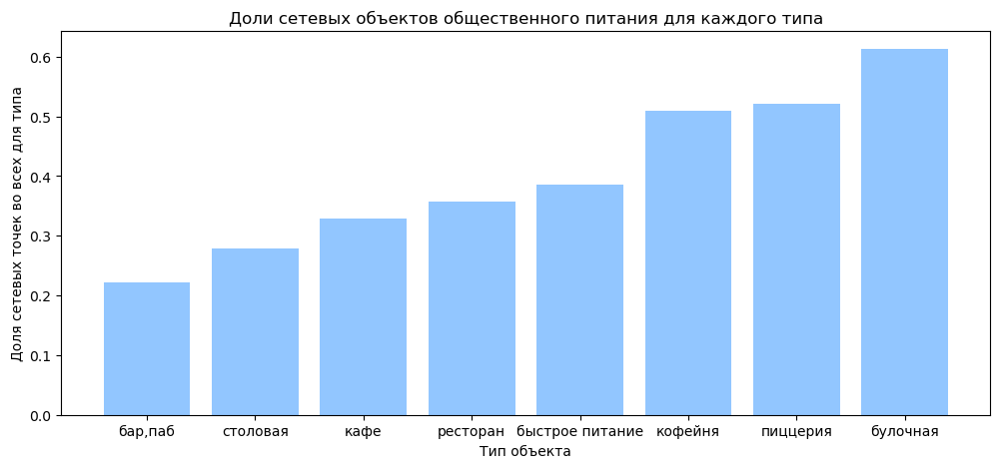

In [33]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=chain_category['category'], height=chain_category['part'])
    plt.title('Доли сетевых объектов общественного питания для каждого типа')
    plt.ylabel('Доля сетевых точек во всех для типа')
    plt.xlabel('Тип объекта')
plt.show()

**По графику можно сказать, что доля сетевых заведений самая большая у категории "булочная" - 61,3%. На втором месте "пиццерия" и "кофейня" - 52-51%; третье место у "быстрого питания" - 38,5%. Меньше всего сетевых объект в категории "бар, паб".**

## 3.5 Топ-15 сетевых заведений

In [34]:
# топ-15 сетевых заведений
grouped_chain_top15 = grouped_chain[:15]
grouped_chain_top15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


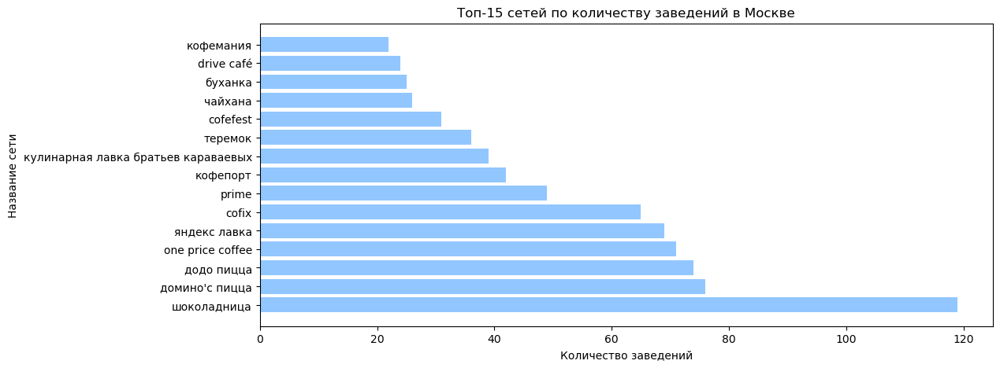

In [35]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.barh(y=grouped_chain_top15['name'], width=grouped_chain_top15['count'])
    plt.title('Топ-15 сетей по количеству заведений в Москве')
    plt.ylabel('Название сети')
    plt.xlabel('Количество заведений')
plt.show()

**Многие заведения из топа знакомы: Шоколадница, Доминос, Додо, One Price Coffee, Яндекс Лавка, Cofix, Prime, Кулинарная лавка братьев Караваевых, Теремок, Чайхана.**

In [36]:
fig=px.bar(
    grouped_chain_top15, 
    x='name', 
    y='count', 
    color='category', 
    barmode='group', 
    title='Top-15 сетевых заведений по категориям'
)
fig.update_xaxes(tickangle=45)
fig.show()

**Лидирует среди сетевых заведений Москвы: кофейня Шоколадница. Затем пиццерии Домино'с пицца, Додо пицца. В топ-15 сетевых заведений Москвы также входят другие кофений, рестораны, кафе и булочные.**

## 3.6 Заведения по административным районам Москвы

In [37]:
#административные районы Москвы
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [38]:
# сводная таблица со всеми категориями заведений по районам
district_places = (
    pd.pivot_table(places, values='address',index='district',columns='category',aggfunc='count')
    .reset_index()
)

district_places = district_places.set_index('district')
district_places

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,235,193,77,188,41
Северо-Восточный административный округ,63,28,82,269,159,68,181,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [39]:
places_region = places.groupby(['district', 'category'])['name'].count().reset_index()
places_region = places_region.rename(columns={'name': 'count'}).sort_values(by='count', ascending=False).reset_index(drop=True)

In [40]:
fig=px.bar(
    places_region, 
    x='district', 
    y='count', 
    color='category', 
    barmode='group',
    title='Количество заведений по категориям в регионах Москвы'
)
fig.show()

В таблице содержатся данные о 8 районах:
- Восточный адм.округ
- Западный адм.округ
- Северный
- Северо-Восточный
- Северо-Западный
- Центральный
- Юго-Восточный
- Юго-Западный
- Южный

Проанализировав графики, можно прийти к выводу, что:
1. больше всего заведений в Центральном округе (2242 заведения)
2. Во всех районах, кроме Центрального, по количеству лидирует категория "кафе". В Центральном лидирует "ресторан".
3. Меньше всего булочных и столовых во всех районах

In [41]:
#посмотрим топ15 заведений по районам Москвы
grouped_chain_region = chain.groupby(['name','category','district'])['index'].count().reset_index()
grouped_chain_region = grouped_chain_region.rename(columns={'index': 'count'}).sort_values(by='count', ascending=False).reset_index(drop=True)
grouped_chain_region_top15 = grouped_chain_region[:15]
grouped_chain_region_top15

,name,category,district,count
0,шоколадница,кофейня,Центральный административный округ,38
1,prime,ресторан,Центральный административный округ,36
2,кулинарная лавка братьев караваевых,кафе,Центральный административный округ,32
3,cofix,кофейня,Центральный административный округ,20
4,шоколадница,кофейня,Западный административный округ,17
5,one price coffee,кофейня,Центральный административный округ,15
6,кофепорт,кофейня,Центральный административный округ,15
7,кофемания,кофейня,Центральный административный округ,14
8,шоколадница,кофейня,Северный административный округ,13
9,яндекс лавка,ресторан,Южный административный округ,12


In [42]:
fig = px.treemap(
    grouped_chain_region_top15,
    path=['district', 'category', 'name'],
    values='count'
)
fig.show()

In [43]:
#или круговая 
fig = px.sunburst(
    grouped_chain_region_top15,
    path=['district', 'category', 'name'],
    values='count',
    color='district'
)
fig.show()

**Наиболее популярные заведения находятся в 5 районах: 8 заведений в Центральном округ, 3 заведения в Южном, 2 - в Восточном и по одному в Западном и Северном.**

## 3.7 Средние рейтинги по категориям заведений

In [44]:
rating_category = places.groupby('category')['rating'].mean().reset_index().sort_values(by='rating').round(2)
rating_category

,category,rating
2,быстрое питание,4.05
3,кафе,4.12
7,столовая,4.21
1,булочная,4.27
4,кофейня,4.28
6,ресторан,4.29
5,пиццерия,4.30
0,"бар,паб",4.39


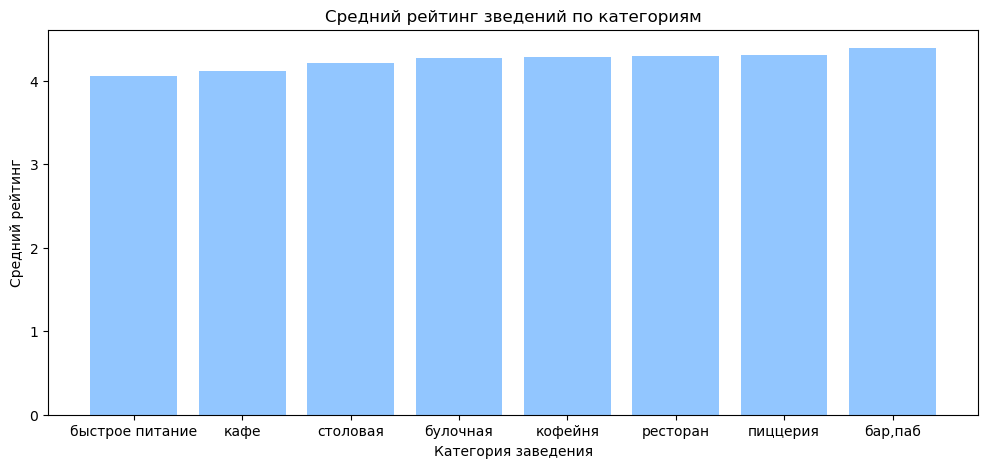

In [45]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=rating_category['category'], height=rating_category['rating'])
    plt.title('Средний рейтинг зведений по категориям')
    plt.ylabel('Средний рейтинг')
    plt.xlabel('Категория заведения')
plt.show()

**Проанализировав графики, можно сказать, что средняя оценка заведения в зависимости от категории отличается. Есть категории, где чаще ставится более высокий рейтинг: "бар/паб", "пиццерия", "ресторан". А хуже рейтинги ставят в "кафе" и "быстрое питание".**

## 3.9 Средний рейтинг по районам

In [46]:
rating_districts = places.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating')
rating_districts

,district,rating
6,Юго-Восточный административный округ,4.101120
3,Северо-Восточный административный округ,4.147978
7,Юго-Западный административный округ,4.172920
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
8,Южный административный округ,4.184417
4,Северо-Западный административный округ,4.208802
2,Северный административный округ,4.239822
5,Центральный административный округ,4.377520


In [47]:
# загружаем JSON-файл с границами округов Москвы
districts = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=districts,
    data=rating_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- **Лучший рейтинг в Центральной районе (4.4)**
- **Низкие рейтинги в Юго-Восточном (4.1)**

## 3.10 Кластеры заведений

In [48]:
# создаём новую пустую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

**Кластеры удобно применять с большим количеством данных. Большие значения количества заведений наблюдаются в Центральном АО, меньше заведение на окраине.**

## 3.11 Топ-15 улиц по количеству заведений

In [49]:
addresses = places.groupby(['street', 'category'])['name'].count().reset_index()
addresses = addresses.rename(columns={'name': 'count'}).sort_values(by='count', ascending=False).reset_index(drop=True)

In [50]:
addresses_grouped = addresses.groupby('street')['count'].sum().reset_index().sort_values(by='count', ascending=False)
addresses_grouped_top15 = addresses_grouped[:15]
addresses_grouped_top15

,street,count
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


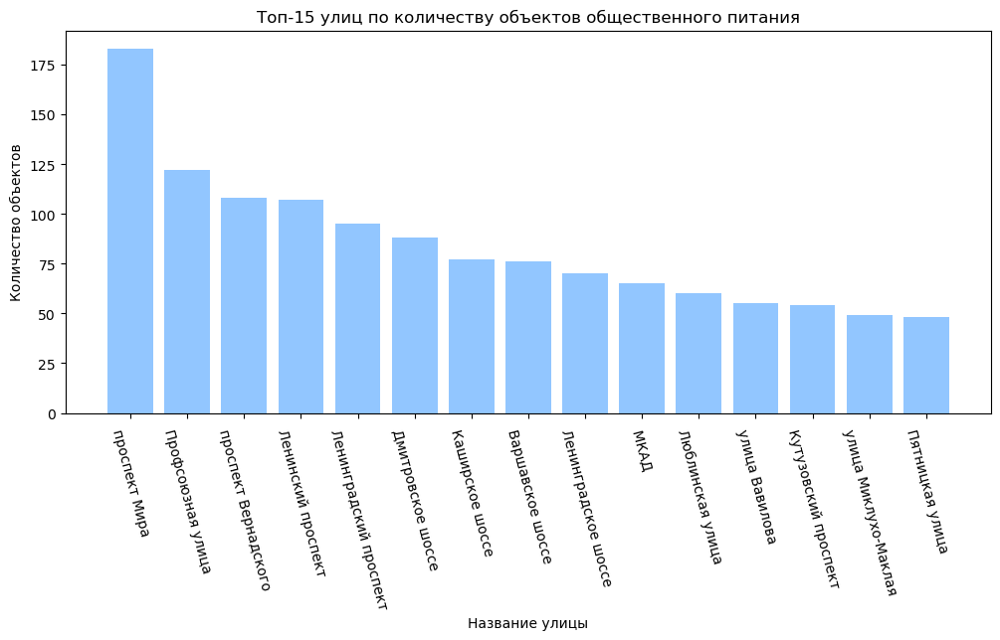

In [51]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=addresses_grouped_top15['street'], height=addresses_grouped_top15['count'])
    plt.title('Топ-15 улиц по количеству объектов общественного питания')
    plt.ylabel('Количество объектов')
    plt.xlabel('Название улицы')
    plt.xticks(rotation=285)
plt.show()

**Лидером общепита Москвы становится - "проспект Мира". Проспект Мира - очень длинная улица, которая располагается в часто посещаемом районе. Не удивительно, что там больше всего заведений. На 2 месте - "Профсоюзная улица" и 3 у - "проспект Вернадского". В ТОП-15 попадают улицы с количеством заведений от 48 до 184.**

In [52]:
top15_streets = addresses_grouped_top15.merge(addresses, on ='street', suffixes=('_total', '_category'))
top15_streets['part'] = round(top15_streets['count_category'] / top15_streets['count_total'], 3)
top15_streets

,street,count_total,category,count_category,part
0,проспект Мира,183,кафе,53,0.290
1,проспект Мира,183,ресторан,44,0.240
2,проспект Мира,183,кофейня,36,0.197
3,проспект Мира,183,быстрое питание,21,0.115
4,проспект Мира,183,"бар,паб",12,0.066
...,...,...,...,...,...
106,Пятницкая улица,48,кафе,7,0.146
107,Пятницкая улица,48,кофейня,6,0.125
108,Пятницкая улица,48,булочная,3,0.062
109,Пятницкая улица,48,пиццерия,3,0.062


## 3.12 Улицы с одним объектом общепита

In [53]:
print('Число улиц с одним объектом общественного питания =', sum(places.groupby('street')['name'].nunique().values==1))

Число улиц с одним объектом общественного питания = 460


In [54]:
adresses_1 = places.groupby(['street']).agg({'address':'count'}).sort_values(by='address',ascending=True).reset_index()
adresses_1.columns = ['street','one_point']
adresses_1 = adresses_1.query('one_point==1')

In [55]:
streets_1_p = adresses_1['street'].tolist()

In [56]:
# выборка со всеми данными о заведениях на улицах c 1 объектом
rest_str_1_p = places.query('street in @streets_1_p')
rest_str_1_p.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,не сеть,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,не сеть,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сеть,NaN,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сеть,NaN,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сеть,NaN,ландшафтный заказник Лианозовский,False


In [57]:
#посмотрим, какие типы заведений есть на улицах с 1 объектом
category_on_street_1 = rest_str_1_p['category'].value_counts().to_frame (name='count').reset_index()
category_on_street_1.columns = ['category', 'count']
category_on_street_1

,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


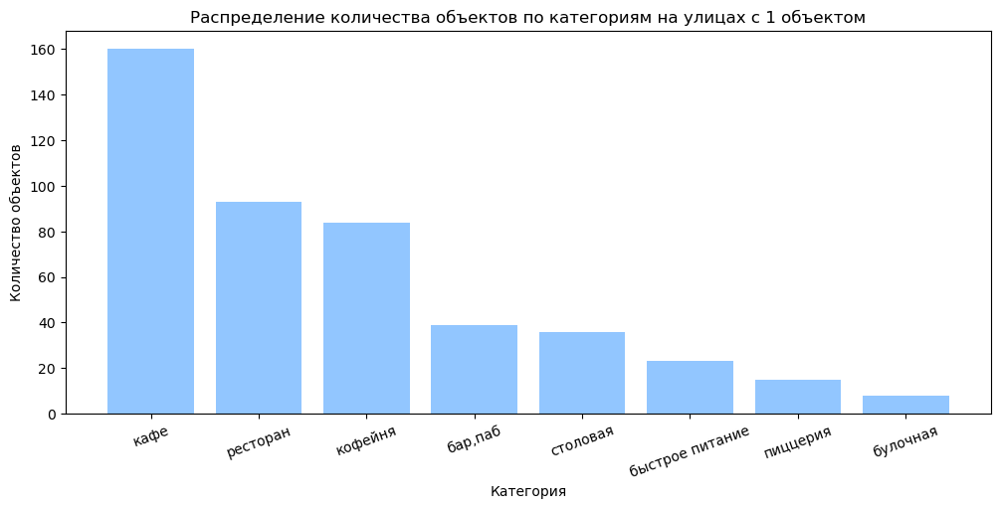

In [58]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=category_on_street_1['category'], height=category_on_street_1['count'])
    plt.title('Распределение количества объектов по категориям на улицах с 1 объектом')
    plt.ylabel('Количество объектов')
    plt.xlabel('Категория')
    plt.xticks(rotation=20)
plt.show()

**Все категории объектов представлены на улицах с 1 объектом. Скорее всего это короткие улицы/переулки, где физически может разместиться всего лишь один объект. Но больше всего улиц с 1 кафе (160 шт). Также много улиц с 1 рестораном (93 шт) и с 1 кофейней (84 шт). Меньше всего улиц с 1 булочной (8 шт.)**

## 3.13 Средний чек для района

In [59]:
middle_avg_bill_districts = places.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_districts

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [60]:
# создаём карту Москвы
s = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=districts,
    data=middle_avg_bill_districts,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(s)

# выводим карту
s

**Средний чек по районам:**
- самое большое значение среднего чека (1000 р) в Центральном и Западном районе. Скорее всего ценник в заведении зависит от аренды. Чем ближе к центру, тем дороже аренда.
- Чем дальше от центра, тем меньше средний чек
- Самый низкий средний чек в Юго-Восточном районе (450 р). В Южном и Северо-Восточном районах тоже невысокий средний чек (500 р).

In [61]:
middle_avg_bill_central_district = places.loc[places['district'] == 'Центральный административный округ']
middle_avg_bill_central_district.head()                                      

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1662,boston seafood & bar,ресторан,"Москва, Лесная улица, 7",Центральный административный округ,"ежедневно, 12:00–00:00",55.778629,37.587275,4.9,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,сеть,120.0,Лесная улица,False
1679,чанчан,ресторан,"Москва, Лесная улица, 1/2",Центральный административный округ,"ежедневно, 11:00–23:00",55.776796,37.585577,4.6,средние,Средний счёт:от 390 ₽,390.0,NaN,не сеть,70.0,Лесная улица,False
1680,лао ли менделеев,кофейня,"Москва, Миусская площадь, 9, стр. 11",Центральный административный округ,"ежедневно, 11:00–23:00",55.778627,37.596560,4.6,средние,Средний счёт:300–500 ₽,400.0,NaN,не сеть,NaN,Миусская площадь,False
1694,steak it easy,"бар,паб","Москва, Лесная улица, 9",Центральный административный округ,пн-чт 09:00–00:00; пт 09:00–06:00; сб 11:00–06...,55.778891,37.588274,4.7,выше среднего,Средний счёт:1300–1700 ₽,1500.0,NaN,сеть,130.0,Лесная улица,False
1695,дача гашека,"бар,паб","Москва, Долгоруковская улица, 31, стр. 32",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–03:00; вс 12:00...",55.777440,37.601842,5.0,выше среднего,Цена бокала пива:280 ₽,NaN,NaN,не сеть,160.0,Долгоруковская улица,False


In [62]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
heatmap_data = middle_avg_bill_central_district[['lat','lng', 'middle_avg_bill']].copy().dropna() # без удаления пустых значений heatmap не сработает
heatmap = heatmap_data[['lat','lng', 'middle_avg_bill']] 
HeatMap(data=heatmap, radius=14).add_to(m)
m 

**Наблюдается зависимость среднего чека от растояния до центра. Чем дальше от центра, тем ценник меньше.**

# 4. Детализация исследования: открытие кофейни

## 4.1 Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [63]:
coffee = places[places['category']=='кофейня']
coffee_count = coffee['address'].count()
print(f'Количество кофеен в датасете {coffee_count}')

Количество кофеен в датасете 1413


In [64]:
# количество кофеен, которые находятся на территории района
cof_count_dis = (
    coffee
    .groupby('district', as_index=False)['address']
    .agg('count')
    .sort_values(by='address', ascending=False)
)
cof_count_dis.columns = ['district', 'count_coffeeshop']
cof_count_dis

,district,count_coffeeshop
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


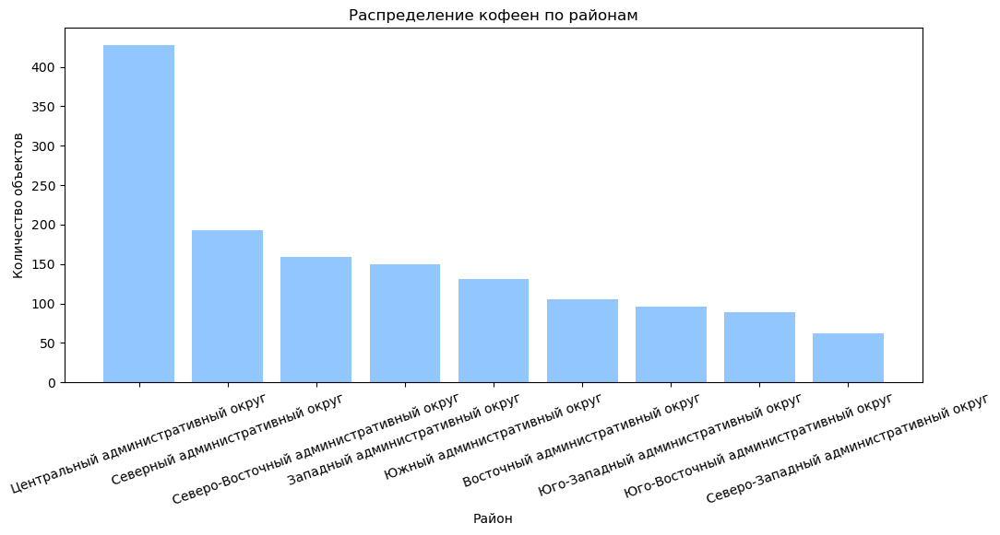

In [65]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=cof_count_dis['district'], height=cof_count_dis['count_coffeeshop'])
    plt.title('Распределение кофеен по районам')
    plt.ylabel('Количество объектов')
    plt.xlabel('Район')
    plt.xticks(rotation=20)
plt.show()

In [66]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=districts,
    data=cof_count_dis,
    columns=['district', 'count_coffeeshop'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

- Больше всего кофеен Центральном районе (428 шт). Достаточно много Северном районе (193 шт)
- Меньше всего в Северо-Западном (62 шт.) и Юго-Восточном (89 шт.)

## 4.2 Есть ли круглосуточные кофейни?

In [67]:
coffee['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

In [68]:
fig = go.Figure(data=[go.Pie(labels=['не круглосуточная кофейня', 'круглосуточная кофейня'], values=coffee['is_24/7'].value_counts(), \
                             title='Соотношение некруглосуточных и круглосуточных кофеен по количеству')])
fig.show()

Круглосуточные кофейни есть (59 штук). От всего количества кофеен это составляет 4,2%. Не самая рациональная идея открывать круглосуточную кофеюню. Ведь люди предпочитают пить кофе утром/днем.

In [69]:
coffee_24 = coffee.loc[coffee['is_24/7'] == True]
coffee_24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,wild bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,сеть,20.0,Дмитровское шоссе,True
971,wild bean cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,сеть,25.0,Ярославское шоссе,True
1047,wild bean cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,сеть,NaN,Ярославское шоссе,True
1214,wild bean cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,сеть,NaN,МКАД,True
1291,шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,сеть,200.0,улица Народного Ополчения,True
1467,кофе хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,сеть,NaN,Ленинградский проспект,True
1789,кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,сеть,15.0,Ленинградский проспект,True
1824,you&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,сеть,NaN,улица Золоторожский Вал,True
1882,кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,сеть,140.0,Лесная улица,True
2029,cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,сеть,230.0,Долгоруковская улица,True


In [70]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
heatmap_data = coffee_24[['lat','lng', 'rating']].copy().dropna() # без удаления пустых значений heatmap не сработает
heatmap = coffee_24[['lat','lng', 'rating']] 
HeatMap(data=heatmap, radius=14).add_to(m)
m 

Кргулосуточные кофейни в основном расположены в Центральном АО. Их рейтинг выше по сравнению с кофенями на окраине.

## 4.3 Какие у кофеен рейтинги? Как они распределяются по районам?

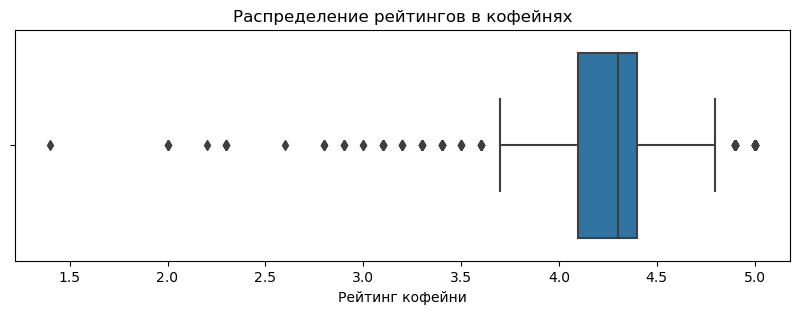

In [71]:
plt.figure(figsize=(10,3))
sns.boxplot(x=coffee['rating'])
plt.xlabel('Рейтинг кофейни')
plt.title('Распределение рейтингов в кофейнях')
plt.show()

**Рейтинги у кофеен:**

- Чаще всего у кофеен рейтинги 4,2 - 4,4
- Нормальный диапазон значений рейтингов (3,7 - 4,8)
- Однако есть кофейни, у которых очень низкий рейтинг и совсем высокий.

In [72]:
# рейтинги кофеен, которые находятся на территории района
cof_rating_dis = (
    coffee
    .groupby('district', as_index=False)['rating']
    .agg('mean')
    .sort_values(by='rating', ascending=False)
)
cof_rating_dis.columns = ['district', 'rating_coffeeshop']
cof_rating_dis['rating_coffeeshop'] = round(cof_rating_dis['rating_coffeeshop'], 2)
cof_rating_dis

,district,rating_coffeeshop
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


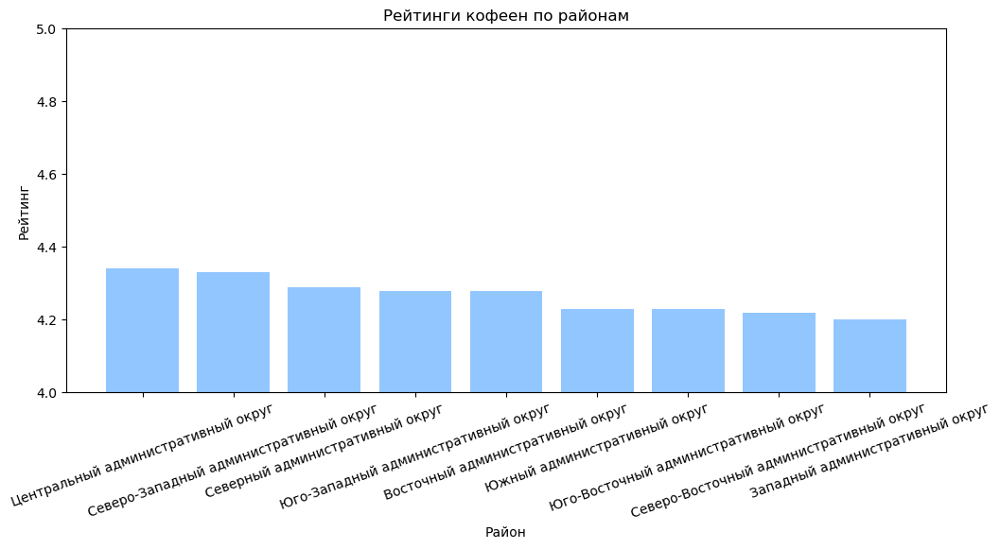

In [73]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=cof_rating_dis['district'], height=cof_rating_dis['rating_coffeeshop'])
    plt.title('Рейтинги кофеен по районам')
    plt.ylabel('Рейтинг')
    plt.xlabel('Район')
    plt.ylim([4,5])
    plt.xticks(rotation=20)
plt.show()

В среднем во всех районах примерно одинаковый рейтинг: 4,3-4,2.

## 4.4 На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [74]:
# средняя цена чашки капучино 
capuch = (
    coffee
    .groupby('district', as_index=False)['middle_coffee_cup']
    .agg('median')
    .sort_values(by='middle_coffee_cup', ascending=False)
)
capuch.columns = ['district', 'middle_coffee_cup']
capuch

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


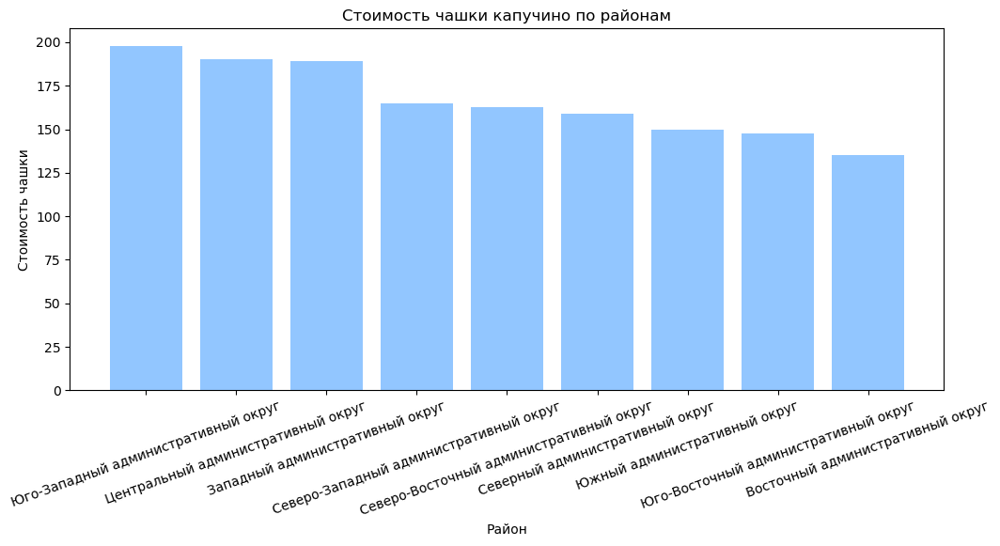

In [75]:
plt.figure(figsize=(12,5))
with plt.style.context('seaborn-pastel'):
    plt.bar(x=capuch['district'], height=capuch['middle_coffee_cup'])
    plt.title('Стоимость чашки капучино по районам')
    plt.ylabel('Стоимость чашки')
    plt.xlabel('Район')
    plt.xticks(rotation=20)
plt.show()

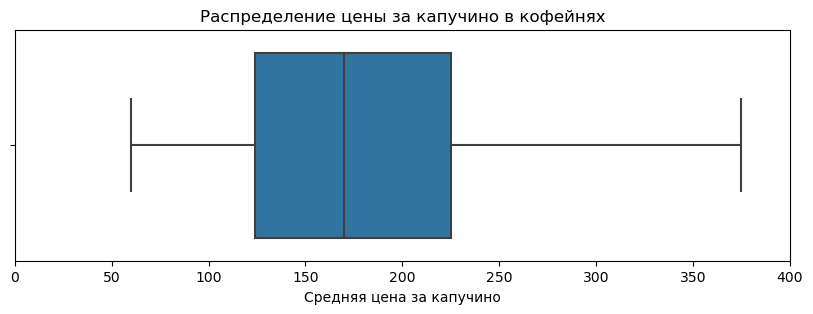

In [76]:
plt.figure(figsize=(10,3))
sns.boxplot(x=coffee['middle_coffee_cup'])
plt.xlim(0,400)
plt.xlabel('Средняя цена за капучино')
plt.title('Распределение цены за капучино в кофейнях')
plt.show()

В среднем по городу, цены за капучино 120-220 рублей. Однако есть кофейни, где цены за чашку капучино от 60 рублей и до 370 рублей.
Цена зависит от объема кружки, поэтому местами могут сильно отличаться цены.

Предлагается ориентироваться на среднюю (медианную) цену чашки капучино по районам, потому что целевая аудитория у каждой кофейни разная, и часто целевая аудитория завязана в локацией (и районом):
- Юго-Западный - 200
- Центральный административный округ - 190
- Западный административный округ - 190
- Северо-Западный административный округ - 170
- Северо-Восточный административный округ -	160
- Северный административный округ -	160
- Южный административный округ - 150
- Юго-Восточный административный округ - 150
- Восточный административный округ - 140

# Презентация

Презентация: <https://drive.google.com/file/d/1-0Hz7oyoQX6mo82CrQO6bhFRPqRnYxEU/view?usp=sharing>

# Выводы

В ходе исследования была проведена работа по предобработке, анализу данных рынка общественного питания в Москве, а также конкретизировано исследование до темы "открытие кофейни" и даны рекомендации для открытия новой кофейни.

База данных состояла из информации о 8406 заведениях. Характеристика заведений: название, категория, часы работы, долгота и широта, рейтинг, категория цен,средняя стоимость заказа в диапазоне, средний чек, цена чашки капучино, сетевое ли заведение, район, посадочные места.

Предобработка данных включала в себя:
- анализ дубликатов и пропусков
- добавление столбца с улицей 
- добавление столбца с характеристикой, круглосуточно ли работает заведение

В ходе анализа данных были сделаны такие выводы:

**Категории заведений:**
- В данных представлены такие категории: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная.
- Больше всего распространены кафе (28%), рестораны (24%) и кофейни (17%).
- Менее всего распространены: булочные (3%), столовые (4%), быстрое питание (7%).

**Посадочные места:**
- Количество посадочных месте в каждой категории держится в одном диапазоне: 50-86 мест. 
- Больше всего посадочных мест в ресторанах, барах/пабах, кофейнях. Меньше всего в кафе, пиццериях и булочных.

**Сетевые заведения:**
- Сетевых заведений больше (61,9 %). Их 5201
- Несетевых 3205 шт. 38,1%.

**Количество сетевых/несетевых в разных категориях**
- Сетевых заведения преобладают в категорияхЖ
1. кафе
2. ресторан
3. бар/паб
- Несетевые заведения у:
1. кофеен
2. пиццерий
3. булочные

**Чаще являются сетевыми:**
Доля сетевых заведений самая большая у категории "кафе" - 24,3%. На втором месте "ресторан" - 22,8%; третье место у "кофейни" - 22,5%.

**ТОП-15 популярных сетей в Москве:**

- Шоколадница	119 шт
- Домино'с Пицца	76 шт
- Додо Пицца	74 шт
- One Price Coffee	71 шт
- Яндекс Лавка	69 шт
- Cofix	65 шт
- Prime	49 шт
- КОФЕПОРТ	42 шт
- Кулинарная лавка братьев Караваевых	39 шт
- Теремок	36 шт
- Сщауауые 31 шт
- Чайхана	26 шт
- Буханка 25 шт
- drive Cafe 24 шт
- кофемания 22 шт

- Многие заведения из топа знакомы: Шоколадница, Доминос, Додо, One Price Coffee, Яндекс Лавка, Cofix, Кулинарная лавка братьев Караваевых, Теремок, Чайхана. 

**Районы**
В таблице содержатся данные о 8 районах:
- Восточный адм.округ
- Западный адм.округ
- Северный
- Северо-Восточный
- Северо-Западный
- Центральный
- Юго-Восточный
- Юго-Западный
- Южный

**Заведения, категории и районы:**
1. больше всего заведений в Центральном округе (2242 заведения)
2. Во всех районах, кроме Центрального, по количеству лидирует категория "кафе". В Центральном лидирует "ресторан".
3. Меньше всего булочных и столовых во всех районах

**Категории и рейтинги**
- средняя оценка заведения в зависимости от категории отличается. Есть категории, где чаще ставится более высокий рейтинг: "бар/паб", "ресторан". А хуже рейтинги ставят в "кафе" и "быстрое питание".
- Основной диапазон рейтингов: 4-4,6

**Рейтинги заведений в районах**
- Лучший рейтинг в Центральной районе (4.4)
- Низкие рейтинги в Юго-Восточном и Северо-Восточном районах (4.2)

**ТОП-15 улиц по количеству заведений:**
- проспект Мира	`184`
- Профсоюзная улица	`122`
- проспект Вернадского	`108`
- Ленинский проспект	`107`
- Ленинградский проспект	`95`
- Дмитровское шоссе	`88`
- Каширское шоссе	`77`
- Варшавское шоссе	`76`
- Ленинградское шоссе	`70`
- МКАД	`65`
- Люблинская улица	`60`
- улица Вавилова	`55`
- Кутузовский проспект	`54`
- улица Миклухо-Маклая	`49`
- Пятницкая улица	`48`

- Наибольшее количество заведений на проспекте Мира (184 шт.)
- Также более 100 объектов на Профсоюзной улице, проспекте Вернадского, Ленинском проспекте.
- В ТОП-15 попадают улицы с количеством заведений от 48 до 184.

**Улицы, на которых всего 1 объект**: их 425.

**Средний чек по районам:**
- самое большое значение среднего чека (1000 р) в Центральном и Западном районе
- Чем дальше от центра, тем меньше средний чек
- Самый низкий средний чек в Юго-Восточном районе (450 р). В Южном и Северо-Восточном районах тоже невысокий средний чек (500 р).

### Рекомендация для открытия нового заведения.

Рекомендации для открытия новой кофейни:
1. определиться с целевой аудиторией, видом кофейни (specialty / обычная)
    1. specialty кофейня: за счет своей уникальности, меню, атмосферы, коллектива она сможет стать конкурентоспособной и тогда ее можно открыть в Центральном районе (районе, где больше всего кофеен и цена за чашку капучино 190 рублей)
    2. обычная: открыть в районах, не насыщенных кофейнями. В зависимости от других вводных и средней чашки капучино предлагается 3 района: 
    - Северо-Западный район - хорошая цена за чашку капучино (170 р) и самое маленькое количество кофеен (62 шт.)
    - Юго-Западный район - самая высокая цена а чашку капучино (200 р) и небольшое количество кофеен (96 шт.)
    - Западный район - хорошая цена а чашку капучино (190 р) и нормальное количество кофеен (150 р)
2. Средние рейтинги во всех районах примерно одинаковые, не стоит пугаться отдаленных от города районов.
3. Часто целевая аудитория завязана в локацией (и районом), поэтому следует ориентироваться  на среднюю (медианную) цену чашки капучино по районам.
4. Есть небольшое количество круглосуточных кофеен (4,2 % от всего количества)